In [1]:
!pip install fiftyone
!pip install torch torchvision

     |████████████████████████████████| 1.2 MB 4.0 MB/s 
     |████████████████████████████████| 225 kB 63.9 MB/s 
     |████████████████████████████████| 79.9 MB 103 kB/s 
     |████████████████████████████████| 131 kB 40.2 MB/s 
     |████████████████████████████████| 106 kB 53.3 MB/s 
     |████████████████████████████████| 47.6 MB 76 kB/s 
     |████████████████████████████████| 29.2 MB 56 kB/s 
     |████████████████████████████████| 557 kB 61.1 MB/s 
     |████████████████████████████████| 55 kB 4.7 MB/s 
     |████████████████████████████████| 631 kB 66.2 MB/s 
     |████████████████████████████████| 13.2 MB 22.6 MB/s 
     |████████████████████████████████| 82 kB 838 kB/s 
     |████████████████████████████████| 58 kB 7.7 MB/s 
     |████████████████████████████████| 54 kB 3.5 MB/s 
     |████████████████████████████████| 78 kB 8.7 MB/s 
     |████████████████████████████████| 77 kB 7.6 MB/s 
     |████████████████████████████████| 79 kB 10.6 MB/s 
     |███████████████████████

In [2]:
%%shell

# Download TorchVision repo to use some files from
# references/detection
git clone https://github.com/pytorch/vision.git
cd vision
git checkout v0.3.0

cp references/detection/utils.py ../
cp references/detection/transforms.py ../
cp references/detection/coco_eval.py ../
cp references/detection/engine.py ../
cp references/detection/coco_utils.py ../

Cloning into 'vision'...
remote: Enumerating objects: 52243, done.
remote: Counting objects: 100% (17714/17714), done.
remote: Compressing objects: 100% (3752/3752), done.
remote: Total 52243 (delta 14604), reused 16550 (delta 13758), pack-reused 34529
Receiving objects: 100% (52243/52243), 93.31 MiB | 23.87 MiB/s, done.
Resolving deltas: 100% (41159/41159), done.
Note: checking out 'v0.3.0'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>

HEAD is now at be376084 version check against PyTorch's CUDA version


Load data from OpenImages

In [3]:
import torch

torch.manual_seed(1)

import fiftyone as fo
import fiftyone.zoo as foz

In [4]:
fo_dataset = foz.load_zoo_dataset("coco-2017", "validation")

 100% |██████|    1.9Gb/1.9Gb [16.1s elapsed, 0s remaining, 139.1Mb/s]      
Extracting annotations to '/root/fiftyone/coco-2017/raw/instances_val2017.json'
 100% |██████|    6.1Gb/6.1Gb [49.5s elapsed, 0s remaining, 120.9Mb/s]      
Extracting images to '/root/fiftyone/coco-2017/validation/data'
Writing annotations to '/root/fiftyone/coco-2017/validation/labels.json'
Dataset info written to '/root/fiftyone/coco-2017/info.json'
Loading 'coco-2017' split 'validation'
 100% |███████████████| 5000/5000 [29.4s elapsed, 0s remaining, 181.0 samples/s]      
Dataset 'coco-2017-validation' created


In [5]:
fo_dataset.compute_metadata()

we change the format of the dataset to fit pytorch model

In [6]:
import torch
import fiftyone.utils.coco as fouc
from PIL import Image


class FiftyOneTorchDataset(torch.utils.data.Dataset):
    """A class to construct a PyTorch dataset from a FiftyOne dataset.
    
    Args:
        fiftyone_dataset: a FiftyOne dataset or view that will be used for training or testing
        transforms (None): a list of PyTorch transforms to apply to images and targets when loading
        gt_field ("ground_truth"): the name of the field in fiftyone_dataset that contains the 
            desired labels to load
        classes (None): a list of class strings that are used to define the mapping between
            class names and indices. If None, it will use all classes present in the given fiftyone_dataset.
    """

    def __init__(
        self,
        fiftyone_dataset,
        transforms=None,
        gt_field="ground_truth",
        classes=None,
    ):
        self.samples = fiftyone_dataset
        self.transforms = transforms
        self.gt_field = gt_field

        self.img_paths = self.samples.values("filepath")

        self.classes = classes
        if not self.classes:
            # Get list of distinct labels that exist in the view
            self.classes = self.samples.distinct(
                "%s.detections.label" % gt_field
            )

        if self.classes[0] != "background":
            self.classes = ["background"] + self.classes

        self.labels_map_rev = {c: i for i, c in enumerate(self.classes)}

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        sample = self.samples[img_path]
        metadata = sample.metadata
        img = Image.open(img_path).convert("RGB")

        boxes = []
        labels = []
        area = []
        iscrowd = []
        detections = sample[self.gt_field].detections
        for det in detections:
            category_id = self.labels_map_rev[det.label]
            coco_obj = fouc.COCOObject.from_detection(
                det, metadata, category_id=category_id,
            )
            x, y, w, h = coco_obj.bbox
            boxes.append([x, y, x + w, y + h])
            labels.append(coco_obj.category_id)
            area.append(coco_obj.area)
            iscrowd.append(coco_obj.iscrowd)

        target = {}
        target["boxes"] = torch.as_tensor(boxes, dtype=torch.float32)
        target["labels"] = torch.as_tensor(labels, dtype=torch.int64)
        target["image_id"] = torch.as_tensor([idx])
        target["area"] = torch.as_tensor(area, dtype=torch.float32)
        target["iscrowd"] = torch.as_tensor(iscrowd, dtype=torch.int64)

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.img_paths)

    def get_classes(self):
        return self.classes

In [7]:
from fiftyone import ViewField as F

vehicles_list = ["car", "truck", "person"]
vehicles_view = fo_dataset.filter_labels("ground_truth",
        F("label").is_in(vehicles_list))

print(len(vehicles_view))

2909


In [8]:
# From the torchvision references we cloned
import transforms as T

train_transforms = T.Compose([T.ToTensor(), T.RandomHorizontalFlip(0.5)])
test_transforms = T.Compose([T.ToTensor()])

In [9]:
# split the dataset in train and test set
train_view = vehicles_view.take(2668, seed=42)
test_view = vehicles_view.exclude([s.id for s in train_view])

In [10]:
# use our dataset and defined transformations
torch_dataset = FiftyOneTorchDataset(train_view, train_transforms, classes=vehicles_list)
torch_dataset_test = FiftyOneTorchDataset(test_view, test_transforms, classes=vehicles_list)

In [11]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

def get_model(num_classes):
    # load a model pre-trained pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_fpn(pretrained=True)
    
    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    ####numclasses to len(vehicle list)+1
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

In [12]:
model_mobilenet = get_model(len(vehicles_list)+1)

Downloading: "https://download.pytorch.org/models/fasterrcnn_mobilenet_v3_large_fpn-fb6a3cc7.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_mobilenet_v3_large_fpn-fb6a3cc7.pth


  0%|          | 0.00/74.2M [00:00<?, ?B/s]

In [13]:
# Import functions from the torchvision references we cloned
from engine import train_one_epoch, evaluate
import utils

In [14]:
def do_training(model, torch_dataset, torch_dataset_test, num_epochs=5):
    # define training and validation data loaders
    data_loader = torch.utils.data.DataLoader(
        torch_dataset, batch_size=3, shuffle=True, num_workers=4,
        collate_fn=utils.collate_fn)
    
    data_loader_test = torch.utils.data.DataLoader(
        torch_dataset_test, batch_size=1, shuffle=False, num_workers=4,
        collate_fn=utils.collate_fn)

    # train on the GPU or on the CPU, if a GPU is not available
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    print("Using device %s" % device)

    # move model to the right device
    model.to(device)

    # construct an optimizer
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.003,
                                momentum=0.9, weight_decay=0.0005)
    # and a learning rate scheduler
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                    step_size=3,
                                                    gamma=0.1)

    for epoch in range(num_epochs):
        # train for one epoch, printing every 10 iterations
        train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=30)

        # update the learning rate
        lr_scheduler.step()
        # evaluate on the test dataset
        evaluate(model, data_loader_test, device=device)

In [15]:
do_training(model_mobilenet, torch_dataset, torch_dataset_test, num_epochs=5)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Using device cuda


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Epoch: [0]  [  0/890]  eta: 0:28:50  lr: 0.000006  loss: 2.1897 (2.1897)  loss_classifier: 1.4944 (1.4944)  loss_box_reg: 0.5433 (0.5433)  loss_objectness: 0.1253 (0.1253)  loss_rpn_box_reg: 0.0267 (0.0267)  time: 1.9441  data: 1.0377  max mem: 1276
Epoch: [0]  [ 30/890]  eta: 0:04:01  lr: 0.000108  loss: 1.7414 (1.8765)  loss_classifier: 1.0594 (1.2148)  loss_box_reg: 0.5147 (0.5327)  loss_objectness: 0.0510 (0.0815)  loss_rpn_box_reg: 0.0279 (0.0475)  time: 0.2230  data: 0.0226  max mem: 1738
Epoch: [0]  [ 60/890]  eta: 0:03:31  lr: 0.000209  loss: 1.0792 (1.5931)  loss_classifier: 0.4569 (0.8739)  loss_box_reg: 0.4917 (0.5372)  loss_objectness: 0.0578 (0.1298)  loss_rpn_box_reg: 0.0374 (0.0522)  time: 0.2242  data: 0.0247  max mem: 1740
Epoch: [0]  [ 90/890]  eta: 0:03:15  lr: 0.000310  loss: 1.1198 (1.3992)  loss_classifier: 0.4043 (0.7106)  loss_box_reg: 0.5386 (0.5249)  loss_objectness: 0.0672 (0.1165)  loss_rpn_box_reg: 0.0293 (0.0472)  time: 0.2225  data: 0.0221  max mem: 1740


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Test:  [  0/241]  eta: 0:01:38  model_time: 0.1139 (0.1139)  evaluator_time: 0.0100 (0.0100)  time: 0.4091  data: 0.2835  max mem: 1740
Test:  [100/241]  eta: 0:00:07  model_time: 0.0309 (0.0319)  evaluator_time: 0.0031 (0.0091)  time: 0.0474  data: 0.0061  max mem: 1740
Test:  [200/241]  eta: 0:00:01  model_time: 0.0284 (0.0310)  evaluator_time: 0.0026 (0.0077)  time: 0.0431  data: 0.0053  max mem: 1740
Test:  [240/241]  eta: 0:00:00  model_time: 0.0268 (0.0305)  evaluator_time: 0.0046 (0.0082)  time: 0.0469  data: 0.0045  max mem: 1740
Test: Total time: 0:00:11 (0.0476 s / it)
Averaged stats: model_time: 0.0268 (0.0305)  evaluator_time: 0.0046 (0.0082)
Accumulating evaluation results...
DONE (t=0.11s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.317
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.323
 Average Precision  (AP) @[ I

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Epoch: [1]  [  0/890]  eta: 0:19:33  lr: 0.003000  loss: 0.4971 (0.4971)  loss_classifier: 0.1652 (0.1652)  loss_box_reg: 0.3028 (0.3028)  loss_objectness: 0.0101 (0.0101)  loss_rpn_box_reg: 0.0190 (0.0190)  time: 1.3186  data: 1.0142  max mem: 1740
Epoch: [1]  [ 30/890]  eta: 0:03:47  lr: 0.003000  loss: 0.4545 (0.5602)  loss_classifier: 0.1504 (0.1752)  loss_box_reg: 0.1970 (0.2750)  loss_objectness: 0.0406 (0.0587)  loss_rpn_box_reg: 0.0397 (0.0513)  time: 0.2211  data: 0.0228  max mem: 1740
Epoch: [1]  [ 60/890]  eta: 0:03:23  lr: 0.003000  loss: 0.5490 (0.5560)  loss_classifier: 0.1900 (0.1813)  loss_box_reg: 0.2755 (0.2755)  loss_objectness: 0.0501 (0.0543)  loss_rpn_box_reg: 0.0240 (0.0448)  time: 0.2181  data: 0.0232  max mem: 1740
Epoch: [1]  [ 90/890]  eta: 0:03:09  lr: 0.003000  loss: 0.5398 (0.5446)  loss_classifier: 0.1667 (0.1784)  loss_box_reg: 0.2724 (0.2679)  loss_objectness: 0.0524 (0.0532)  loss_rpn_box_reg: 0.0413 (0.0450)  time: 0.2170  data: 0.0260  max mem: 1740


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Test:  [  0/241]  eta: 0:03:17  model_time: 0.0985 (0.0985)  evaluator_time: 0.0107 (0.0107)  time: 0.8180  data: 0.7071  max mem: 1772
Test:  [100/241]  eta: 0:00:07  model_time: 0.0308 (0.0310)  evaluator_time: 0.0034 (0.0091)  time: 0.0441  data: 0.0049  max mem: 1772
Test:  [200/241]  eta: 0:00:01  model_time: 0.0283 (0.0303)  evaluator_time: 0.0020 (0.0073)  time: 0.0421  data: 0.0058  max mem: 1772
Test:  [240/241]  eta: 0:00:00  model_time: 0.0278 (0.0300)  evaluator_time: 0.0032 (0.0076)  time: 0.0454  data: 0.0045  max mem: 1772
Test: Total time: 0:00:11 (0.0485 s / it)
Averaged stats: model_time: 0.0278 (0.0300)  evaluator_time: 0.0032 (0.0076)
Accumulating evaluation results...
DONE (t=0.10s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.321
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.561
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.335
 Average Precision  (AP) @[ I

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Epoch: [2]  [  0/890]  eta: 0:17:14  lr: 0.003000  loss: 0.3513 (0.3513)  loss_classifier: 0.1449 (0.1449)  loss_box_reg: 0.1633 (0.1633)  loss_objectness: 0.0302 (0.0302)  loss_rpn_box_reg: 0.0129 (0.0129)  time: 1.1627  data: 0.9544  max mem: 1772
Epoch: [2]  [ 30/890]  eta: 0:03:44  lr: 0.003000  loss: 0.4287 (0.4363)  loss_classifier: 0.1478 (0.1447)  loss_box_reg: 0.2027 (0.2072)  loss_objectness: 0.0279 (0.0383)  loss_rpn_box_reg: 0.0258 (0.0461)  time: 0.2239  data: 0.0248  max mem: 1772
Epoch: [2]  [ 60/890]  eta: 0:03:20  lr: 0.003000  loss: 0.4981 (0.4848)  loss_classifier: 0.1663 (0.1614)  loss_box_reg: 0.2634 (0.2402)  loss_objectness: 0.0422 (0.0384)  loss_rpn_box_reg: 0.0319 (0.0448)  time: 0.2205  data: 0.0246  max mem: 1772
Epoch: [2]  [ 90/890]  eta: 0:03:07  lr: 0.003000  loss: 0.4633 (0.4828)  loss_classifier: 0.1378 (0.1611)  loss_box_reg: 0.2380 (0.2396)  loss_objectness: 0.0274 (0.0383)  loss_rpn_box_reg: 0.0240 (0.0439)  time: 0.2193  data: 0.0267  max mem: 1772


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Test:  [  0/241]  eta: 0:01:40  model_time: 0.1243 (0.1243)  evaluator_time: 0.0025 (0.0025)  time: 0.4175  data: 0.2878  max mem: 1772
Test:  [100/241]  eta: 0:00:06  model_time: 0.0307 (0.0309)  evaluator_time: 0.0027 (0.0076)  time: 0.0434  data: 0.0055  max mem: 1772
Test:  [200/241]  eta: 0:00:01  model_time: 0.0291 (0.0301)  evaluator_time: 0.0018 (0.0064)  time: 0.0419  data: 0.0055  max mem: 1772
Test:  [240/241]  eta: 0:00:00  model_time: 0.0292 (0.0298)  evaluator_time: 0.0033 (0.0069)  time: 0.0456  data: 0.0048  max mem: 1772
Test: Total time: 0:00:10 (0.0454 s / it)
Averaged stats: model_time: 0.0292 (0.0298)  evaluator_time: 0.0033 (0.0069)
Accumulating evaluation results...
DONE (t=0.08s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.318
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.549
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.334
 Average Precision  (AP) @[ I

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Epoch: [3]  [  0/890]  eta: 0:16:02  lr: 0.000300  loss: 0.1748 (0.1748)  loss_classifier: 0.0741 (0.0741)  loss_box_reg: 0.0717 (0.0717)  loss_objectness: 0.0132 (0.0132)  loss_rpn_box_reg: 0.0158 (0.0158)  time: 1.0810  data: 0.8217  max mem: 1772
Epoch: [3]  [ 30/890]  eta: 0:03:44  lr: 0.000300  loss: 0.3305 (0.4367)  loss_classifier: 0.1189 (0.1623)  loss_box_reg: 0.1768 (0.2140)  loss_objectness: 0.0288 (0.0261)  loss_rpn_box_reg: 0.0293 (0.0343)  time: 0.2252  data: 0.0243  max mem: 1772
Epoch: [3]  [ 60/890]  eta: 0:03:18  lr: 0.000300  loss: 0.4228 (0.4588)  loss_classifier: 0.1451 (0.1665)  loss_box_reg: 0.1974 (0.2233)  loss_objectness: 0.0180 (0.0276)  loss_rpn_box_reg: 0.0361 (0.0415)  time: 0.2145  data: 0.0211  max mem: 1772
Epoch: [3]  [ 90/890]  eta: 0:03:06  lr: 0.000300  loss: 0.3637 (0.4456)  loss_classifier: 0.1373 (0.1624)  loss_box_reg: 0.1954 (0.2169)  loss_objectness: 0.0155 (0.0277)  loss_rpn_box_reg: 0.0253 (0.0385)  time: 0.2191  data: 0.0225  max mem: 1772


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Test:  [  0/241]  eta: 0:01:39  model_time: 0.1270 (0.1270)  evaluator_time: 0.0034 (0.0034)  time: 0.4130  data: 0.2805  max mem: 1772
Test:  [100/241]  eta: 0:00:06  model_time: 0.0283 (0.0315)  evaluator_time: 0.0022 (0.0072)  time: 0.0428  data: 0.0062  max mem: 1772
Test:  [200/241]  eta: 0:00:01  model_time: 0.0276 (0.0305)  evaluator_time: 0.0017 (0.0063)  time: 0.0404  data: 0.0060  max mem: 1772
Test:  [240/241]  eta: 0:00:00  model_time: 0.0292 (0.0303)  evaluator_time: 0.0033 (0.0068)  time: 0.0466  data: 0.0047  max mem: 1772
Test: Total time: 0:00:11 (0.0462 s / it)
Averaged stats: model_time: 0.0292 (0.0303)  evaluator_time: 0.0033 (0.0068)
Accumulating evaluation results...
DONE (t=0.08s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.352
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.584
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.364
 Average Precision  (AP) @[ I

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Epoch: [4]  [  0/890]  eta: 0:17:13  lr: 0.000300  loss: 0.3880 (0.3880)  loss_classifier: 0.1134 (0.1134)  loss_box_reg: 0.1847 (0.1847)  loss_objectness: 0.0210 (0.0210)  loss_rpn_box_reg: 0.0689 (0.0689)  time: 1.1611  data: 0.8338  max mem: 1772
Epoch: [4]  [ 30/890]  eta: 0:03:45  lr: 0.000300  loss: 0.3490 (0.4000)  loss_classifier: 0.1351 (0.1511)  loss_box_reg: 0.1786 (0.2010)  loss_objectness: 0.0216 (0.0237)  loss_rpn_box_reg: 0.0176 (0.0242)  time: 0.2198  data: 0.0238  max mem: 1772
Epoch: [4]  [ 60/890]  eta: 0:03:18  lr: 0.000300  loss: 0.4620 (0.4301)  loss_classifier: 0.1695 (0.1565)  loss_box_reg: 0.1970 (0.2160)  loss_objectness: 0.0176 (0.0255)  loss_rpn_box_reg: 0.0253 (0.0321)  time: 0.2163  data: 0.0239  max mem: 1772
Epoch: [4]  [ 90/890]  eta: 0:03:06  lr: 0.000300  loss: 0.3857 (0.4246)  loss_classifier: 0.1241 (0.1536)  loss_box_reg: 0.1989 (0.2157)  loss_objectness: 0.0140 (0.0253)  loss_rpn_box_reg: 0.0202 (0.0299)  time: 0.2188  data: 0.0239  max mem: 1772


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning: MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe
  "MongoClient opened before fork. Create MongoClient only "
/usr/local/lib/python3.7/dist-package

Test:  [  0/241]  eta: 0:01:28  model_time: 0.0749 (0.0749)  evaluator_time: 0.0185 (0.0185)  time: 0.3690  data: 0.2740  max mem: 1772
Test:  [100/241]  eta: 0:00:06  model_time: 0.0281 (0.0300)  evaluator_time: 0.0019 (0.0078)  time: 0.0419  data: 0.0057  max mem: 1772
Test:  [200/241]  eta: 0:00:01  model_time: 0.0272 (0.0294)  evaluator_time: 0.0021 (0.0070)  time: 0.0401  data: 0.0052  max mem: 1772
Test:  [240/241]  eta: 0:00:00  model_time: 0.0266 (0.0292)  evaluator_time: 0.0032 (0.0074)  time: 0.0449  data: 0.0049  max mem: 1772
Test: Total time: 0:00:10 (0.0450 s / it)
Averaged stats: model_time: 0.0266 (0.0292)  evaluator_time: 0.0032 (0.0074)
Accumulating evaluation results...
DONE (t=0.09s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.345
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.586
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.328
 Average Precision  (AP) @[ I

we need to run inference on the test data to get the output in fiftyone format



In [16]:
def convert_torch_predictions(preds, det_id, s_id, w, h, classes):
    # Convert the outputs of the torch model into a FiftyOne Detections object
    dets = []
    for bbox, label, score in zip(
        preds["boxes"].cpu().detach().numpy(), 
        preds["labels"].cpu().detach().numpy(), 
        preds["scores"].cpu().detach().numpy()
    ):
        # Parse prediction into FiftyOne Detection object
        x0,y0,x1,y1 = bbox
        coco_obj = fouc.COCOObject(det_id, s_id, int(label), [x0, y0, x1-x0, y1-y0])
        det = coco_obj.to_detection((w,h), classes)
        det["confidence"] = float(score)
        dets.append(det)
        det_id += 1
        
    detections = fo.Detections(detections=dets)
        
    return detections, det_id

def add_detections(model, torch_dataset, view, field_name="predictions"):
    # Run inference on a dataset and add results to FiftyOne
    torch.set_num_threads(1)
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    print("Using device %s" % device)

    model.eval()
    model.to(device)
    image_paths = torch_dataset.img_paths
    classes = torch_dataset.classes
    det_id = 0
    
    with fo.ProgressBar() as pb:
        for img, targets in pb(torch_dataset):
            # Get FiftyOne sample indexed by unique image filepath
            img_id = int(targets["image_id"][0])
            img_path = image_paths[img_id]
            sample = view[img_path]
            s_id = sample.id
            w = sample.metadata["width"]
            h = sample.metadata["height"]
            
            # Inference
            preds = model(img.unsqueeze(0).to(device))[0]
            
            detections, det_id = convert_torch_predictions(
                preds, 
                det_id, 
                s_id, 
                w, 
                h, 
                classes,
            )
            
            sample[field_name] = detections
            sample.save()

In [17]:
add_detections(model_mobilenet, torch_dataset_test, fo_dataset, field_name="predictions")

Using device cuda
 100% |█████████████████| 241/241 [15.2s elapsed, 0s remaining, 13.9 samples/s]      


In [18]:
results = fo.evaluate_detections(
    test_view, 
    "predictions", 
    classes = ["car", "truck", "person"],
    eval_key="eval", 
    compute_mAP=True
)

Evaluating detections...
 100% |█████████████████| 241/241 [6.8s elapsed, 0s remaining, 29.0 samples/s]       
Performing IoU sweep...
 100% |█████████████████| 241/241 [9.0s elapsed, 0s remaining, 15.7 samples/s]       


In [19]:
results.mAP()

0.3448118978766641

In [20]:
results.print_report()

              precision    recall  f1-score   support

         car       0.27      0.79      0.40       263
       truck       0.12      0.69      0.20        29
      person       0.48      0.89      0.62      1916

   micro avg       0.43      0.87      0.58      2208
   macro avg       0.29      0.79      0.41      2208
weighted avg       0.45      0.87      0.59      2208



In [21]:
results_interclass = fo.evaluate_detections(
    test_view, 
    "predictions", 
    classes= ["car", "truck", "person"],
    compute_mAP=True, 
    classwise=False
)

Evaluating detections...
 100% |█████████████████| 241/241 [6.0s elapsed, 0s remaining, 29.7 samples/s]       
Performing IoU sweep...
 100% |█████████████████| 241/241 [9.2s elapsed, 0s remaining, 15.4 samples/s]       


In [22]:
results_interclass.plot_confusion_matrix()

/usr/local/lib/python3.7/dist-packages/fiftyone/core/plots/plotly.py:1118: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://voxel51.com/docs/fiftyone/user_guide/plots.html#working-in-notebooks for more information.



In [23]:
# map labels to single vehicle class 
vehicles_map = {c: "vehicle" for c in vehicles_list}

train_map_view = train_view.map_labels("ground_truth", vehicles_map)
test_map_view = test_view.map_labels("ground_truth", vehicles_map)

# use our dataset and defined transformations
torch_map_dataset = FiftyOneTorchDataset(train_map_view, train_transforms)
torch_map_dataset_test = FiftyOneTorchDataset(test_map_view, test_transforms)

In [25]:
# Only 2 classes (background and vehicle)
vehicle_model = get_model(2)

In [26]:
do_training(vehicle_model, torch_map_dataset, torch_map_dataset_test)

Using device cuda


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning:

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-package

Epoch: [0]  [  0/890]  eta: 0:19:32  lr: 0.000006  loss: 1.8118 (1.8118)  loss_classifier: 0.7308 (0.7308)  loss_box_reg: 0.9580 (0.9580)  loss_objectness: 0.0691 (0.0691)  loss_rpn_box_reg: 0.0539 (0.0539)  time: 1.3171  data: 0.9846  max mem: 1772
Epoch: [0]  [ 30/890]  eta: 0:03:53  lr: 0.000108  loss: 1.2564 (1.4679)  loss_classifier: 0.5738 (0.6208)  loss_box_reg: 0.6168 (0.6100)  loss_objectness: 0.0891 (0.1719)  loss_rpn_box_reg: 0.0360 (0.0652)  time: 0.2222  data: 0.0239  max mem: 1779
Epoch: [0]  [ 60/890]  eta: 0:03:26  lr: 0.000209  loss: 1.0036 (1.2500)  loss_classifier: 0.3324 (0.4930)  loss_box_reg: 0.5086 (0.5782)  loss_objectness: 0.0562 (0.1241)  loss_rpn_box_reg: 0.0270 (0.0547)  time: 0.2251  data: 0.0200  max mem: 1779
Epoch: [0]  [ 90/890]  eta: 0:03:12  lr: 0.000310  loss: 0.9241 (1.1680)  loss_classifier: 0.2856 (0.4262)  loss_box_reg: 0.4605 (0.5533)  loss_objectness: 0.0654 (0.1314)  loss_rpn_box_reg: 0.0451 (0.0571)  time: 0.2254  data: 0.0263  max mem: 1779


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthed

Test:  [  0/241]  eta: 0:01:53  model_time: 0.0866 (0.0866)  evaluator_time: 0.0039 (0.0039)  time: 0.4706  data: 0.3779  max mem: 1912
Test:  [100/241]  eta: 0:00:08  model_time: 0.0303 (0.0350)  evaluator_time: 0.0022 (0.0114)  time: 0.0486  data: 0.0049  max mem: 1912
Test:  [200/241]  eta: 0:00:02  model_time: 0.0304 (0.0346)  evaluator_time: 0.0023 (0.0099)  time: 0.0466  data: 0.0064  max mem: 1912
Test:  [240/241]  eta: 0:00:00  model_time: 0.0284 (0.0345)  evaluator_time: 0.0079 (0.0106)  time: 0.0553  data: 0.0048  max mem: 1912
Test: Total time: 0:00:13 (0.0547 s / it)
Averaged stats: model_time: 0.0284 (0.0345)  evaluator_time: 0.0079 (0.0106)
Accumulating evaluation results...
DONE (t=0.07s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.351
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.636
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.334
 Average Precision  (AP) @[ I

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthed

Epoch: [1]  [  0/890]  eta: 0:17:05  lr: 0.003000  loss: 0.5304 (0.5304)  loss_classifier: 0.1738 (0.1738)  loss_box_reg: 0.2868 (0.2868)  loss_objectness: 0.0416 (0.0416)  loss_rpn_box_reg: 0.0282 (0.0282)  time: 1.1524  data: 0.8292  max mem: 1912
Epoch: [1]  [ 30/890]  eta: 0:03:52  lr: 0.003000  loss: 0.5149 (0.5060)  loss_classifier: 0.1731 (0.1631)  loss_box_reg: 0.2443 (0.2371)  loss_objectness: 0.0363 (0.0477)  loss_rpn_box_reg: 0.0646 (0.0580)  time: 0.2261  data: 0.0230  max mem: 1912
Epoch: [1]  [ 60/890]  eta: 0:03:27  lr: 0.003000  loss: 0.4786 (0.5071)  loss_classifier: 0.1608 (0.1652)  loss_box_reg: 0.2740 (0.2472)  loss_objectness: 0.0424 (0.0475)  loss_rpn_box_reg: 0.0329 (0.0471)  time: 0.2287  data: 0.0253  max mem: 1912
Epoch: [1]  [ 90/890]  eta: 0:03:11  lr: 0.003000  loss: 0.4097 (0.5079)  loss_classifier: 0.1378 (0.1650)  loss_box_reg: 0.2221 (0.2466)  loss_objectness: 0.0294 (0.0491)  loss_rpn_box_reg: 0.0196 (0.0472)  time: 0.2187  data: 0.0228  max mem: 1912


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthed

Test:  [  0/241]  eta: 0:03:48  model_time: 0.1167 (0.1167)  evaluator_time: 0.0026 (0.0026)  time: 0.9497  data: 0.8287  max mem: 1912
Test:  [100/241]  eta: 0:00:08  model_time: 0.0312 (0.0351)  evaluator_time: 0.0024 (0.0094)  time: 0.0494  data: 0.0067  max mem: 1912
Test:  [200/241]  eta: 0:00:02  model_time: 0.0286 (0.0343)  evaluator_time: 0.0020 (0.0089)  time: 0.0462  data: 0.0071  max mem: 1912
Test:  [240/241]  eta: 0:00:00  model_time: 0.0292 (0.0339)  evaluator_time: 0.0039 (0.0097)  time: 0.0538  data: 0.0055  max mem: 1912
Test: Total time: 0:00:13 (0.0562 s / it)
Averaged stats: model_time: 0.0292 (0.0339)  evaluator_time: 0.0039 (0.0097)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.350
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.615
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.341
 Average Precision  (AP) @[ I

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthed

Epoch: [2]  [  0/890]  eta: 0:17:36  lr: 0.003000  loss: 0.1727 (0.1727)  loss_classifier: 0.0683 (0.0683)  loss_box_reg: 0.0931 (0.0931)  loss_objectness: 0.0051 (0.0051)  loss_rpn_box_reg: 0.0063 (0.0063)  time: 1.1873  data: 0.9207  max mem: 1912
Epoch: [2]  [ 30/890]  eta: 0:03:55  lr: 0.003000  loss: 0.4783 (0.5028)  loss_classifier: 0.1605 (0.1663)  loss_box_reg: 0.2335 (0.2514)  loss_objectness: 0.0362 (0.0355)  loss_rpn_box_reg: 0.0342 (0.0496)  time: 0.2297  data: 0.0257  max mem: 1912
Epoch: [2]  [ 60/890]  eta: 0:03:27  lr: 0.003000  loss: 0.4032 (0.4704)  loss_classifier: 0.1332 (0.1576)  loss_box_reg: 0.1654 (0.2351)  loss_objectness: 0.0251 (0.0330)  loss_rpn_box_reg: 0.0318 (0.0447)  time: 0.2284  data: 0.0286  max mem: 1912
Epoch: [2]  [ 90/890]  eta: 0:03:12  lr: 0.003000  loss: 0.3820 (0.4658)  loss_classifier: 0.1178 (0.1542)  loss_box_reg: 0.1992 (0.2315)  loss_objectness: 0.0305 (0.0366)  loss_rpn_box_reg: 0.0321 (0.0435)  time: 0.2152  data: 0.0237  max mem: 1912


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthed

Test:  [  0/241]  eta: 0:01:36  model_time: 0.1239 (0.1239)  evaluator_time: 0.0169 (0.0169)  time: 0.4020  data: 0.2553  max mem: 1918
Test:  [100/241]  eta: 0:00:08  model_time: 0.0340 (0.0358)  evaluator_time: 0.0030 (0.0124)  time: 0.0535  data: 0.0071  max mem: 1918
Test:  [200/241]  eta: 0:00:02  model_time: 0.0298 (0.0345)  evaluator_time: 0.0026 (0.0109)  time: 0.0479  data: 0.0067  max mem: 1918
Test:  [240/241]  eta: 0:00:00  model_time: 0.0299 (0.0342)  evaluator_time: 0.0075 (0.0115)  time: 0.0562  data: 0.0063  max mem: 1918
Test: Total time: 0:00:13 (0.0554 s / it)
Averaged stats: model_time: 0.0299 (0.0342)  evaluator_time: 0.0075 (0.0115)
Accumulating evaluation results...
DONE (t=0.09s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.346
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.623
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.335
 Average Precision  (AP) @[ I

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthed

Epoch: [3]  [  0/890]  eta: 0:18:04  lr: 0.000300  loss: 0.5038 (0.5038)  loss_classifier: 0.1974 (0.1974)  loss_box_reg: 0.2440 (0.2440)  loss_objectness: 0.0315 (0.0315)  loss_rpn_box_reg: 0.0308 (0.0308)  time: 1.2182  data: 0.9883  max mem: 1918
Epoch: [3]  [ 30/890]  eta: 0:03:50  lr: 0.000300  loss: 0.4118 (0.4444)  loss_classifier: 0.1414 (0.1480)  loss_box_reg: 0.2191 (0.2220)  loss_objectness: 0.0266 (0.0330)  loss_rpn_box_reg: 0.0250 (0.0415)  time: 0.2201  data: 0.0285  max mem: 1918
Epoch: [3]  [ 60/890]  eta: 0:03:26  lr: 0.000300  loss: 0.3952 (0.4485)  loss_classifier: 0.1417 (0.1539)  loss_box_reg: 0.2116 (0.2271)  loss_objectness: 0.0200 (0.0298)  loss_rpn_box_reg: 0.0216 (0.0376)  time: 0.2317  data: 0.0251  max mem: 1918
Epoch: [3]  [ 90/890]  eta: 0:03:11  lr: 0.000300  loss: 0.4361 (0.4532)  loss_classifier: 0.1511 (0.1576)  loss_box_reg: 0.2184 (0.2303)  loss_objectness: 0.0206 (0.0292)  loss_rpn_box_reg: 0.0319 (0.0362)  time: 0.2220  data: 0.0238  max mem: 1918


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthed

Test:  [  0/241]  eta: 0:01:41  model_time: 0.0709 (0.0709)  evaluator_time: 0.0100 (0.0100)  time: 0.4195  data: 0.3330  max mem: 1918
Test:  [100/241]  eta: 0:00:07  model_time: 0.0290 (0.0335)  evaluator_time: 0.0023 (0.0093)  time: 0.0468  data: 0.0080  max mem: 1918
Test:  [200/241]  eta: 0:00:02  model_time: 0.0303 (0.0337)  evaluator_time: 0.0023 (0.0083)  time: 0.0448  data: 0.0057  max mem: 1918
Test:  [240/241]  eta: 0:00:00  model_time: 0.0265 (0.0333)  evaluator_time: 0.0045 (0.0090)  time: 0.0522  data: 0.0061  max mem: 1918
Test: Total time: 0:00:13 (0.0543 s / it)
Averaged stats: model_time: 0.0265 (0.0333)  evaluator_time: 0.0045 (0.0090)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.375
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.654
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.367
 Average Precision  (AP) @[ I

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthed

Epoch: [4]  [  0/890]  eta: 0:15:32  lr: 0.000300  loss: 0.2382 (0.2382)  loss_classifier: 0.0882 (0.0882)  loss_box_reg: 0.1272 (0.1272)  loss_objectness: 0.0130 (0.0130)  loss_rpn_box_reg: 0.0097 (0.0097)  time: 1.0483  data: 0.7810  max mem: 1918
Epoch: [4]  [ 30/890]  eta: 0:03:51  lr: 0.000300  loss: 0.4633 (0.4871)  loss_classifier: 0.1559 (0.1638)  loss_box_reg: 0.2466 (0.2566)  loss_objectness: 0.0190 (0.0271)  loss_rpn_box_reg: 0.0240 (0.0396)  time: 0.2336  data: 0.0244  max mem: 1918
Epoch: [4]  [ 60/890]  eta: 0:03:23  lr: 0.000300  loss: 0.4665 (0.4793)  loss_classifier: 0.1672 (0.1633)  loss_box_reg: 0.2397 (0.2476)  loss_objectness: 0.0239 (0.0267)  loss_rpn_box_reg: 0.0419 (0.0416)  time: 0.2223  data: 0.0252  max mem: 1918
Epoch: [4]  [ 90/890]  eta: 0:03:09  lr: 0.000300  loss: 0.3106 (0.4545)  loss_classifier: 0.1219 (0.1578)  loss_box_reg: 0.1511 (0.2348)  loss_objectness: 0.0151 (0.0242)  loss_rpn_box_reg: 0.0300 (0.0376)  time: 0.2159  data: 0.0225  max mem: 1918


/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthedocs.io/en/stable/faq.html#is-pymongo-fork-safe

/usr/local/lib/python3.7/dist-packages/pymongo/topology.py:165: UserWarning:

MongoClient opened before fork. Create MongoClient only after forking. See PyMongo's documentation for details: https://pymongo.readthed

Test:  [  0/241]  eta: 0:02:02  model_time: 0.1251 (0.1251)  evaluator_time: 0.0041 (0.0041)  time: 0.5101  data: 0.3742  max mem: 1918
Test:  [100/241]  eta: 0:00:07  model_time: 0.0319 (0.0337)  evaluator_time: 0.0037 (0.0095)  time: 0.0481  data: 0.0063  max mem: 1918
Test:  [200/241]  eta: 0:00:02  model_time: 0.0294 (0.0328)  evaluator_time: 0.0024 (0.0086)  time: 0.0452  data: 0.0059  max mem: 1918
Test:  [240/241]  eta: 0:00:00  model_time: 0.0267 (0.0330)  evaluator_time: 0.0053 (0.0093)  time: 0.0526  data: 0.0062  max mem: 1918
Test: Total time: 0:00:12 (0.0523 s / it)
Averaged stats: model_time: 0.0267 (0.0330)  evaluator_time: 0.0053 (0.0093)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.372
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.649
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.363
 Average Precision  (AP) @[ I

In [27]:
add_detections(vehicle_model, torch_map_dataset_test, test_map_view, field_name="vehicle_predictions")

Using device cuda
 100% |█████████████████| 241/241 [21.5s elapsed, 0s remaining, 8.9 samples/s]       


In [28]:
vehicle_results = fo.evaluate_detections(
    test_map_view, 
    "vehicle_predictions", 
    classes=["vehicle"], 
    eval_key="vehicle_eval", 
    compute_mAP=True
)

Evaluating detections...
 100% |█████████████████| 241/241 [7.2s elapsed, 0s remaining, 27.0 samples/s]       
Performing IoU sweep...
 100% |█████████████████| 241/241 [9.6s elapsed, 0s remaining, 17.5 samples/s]       


In [29]:
vehicle_results.mAP()

0.37201017279221427

In [30]:
vehicle_results.print_report()

              precision    recall  f1-score   support

     vehicle       0.44      0.88      0.58      2301

   micro avg       0.44      0.88      0.58      2301
   macro avg       0.44      0.88      0.58      2301
weighted avg       0.44      0.88      0.58      2301



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


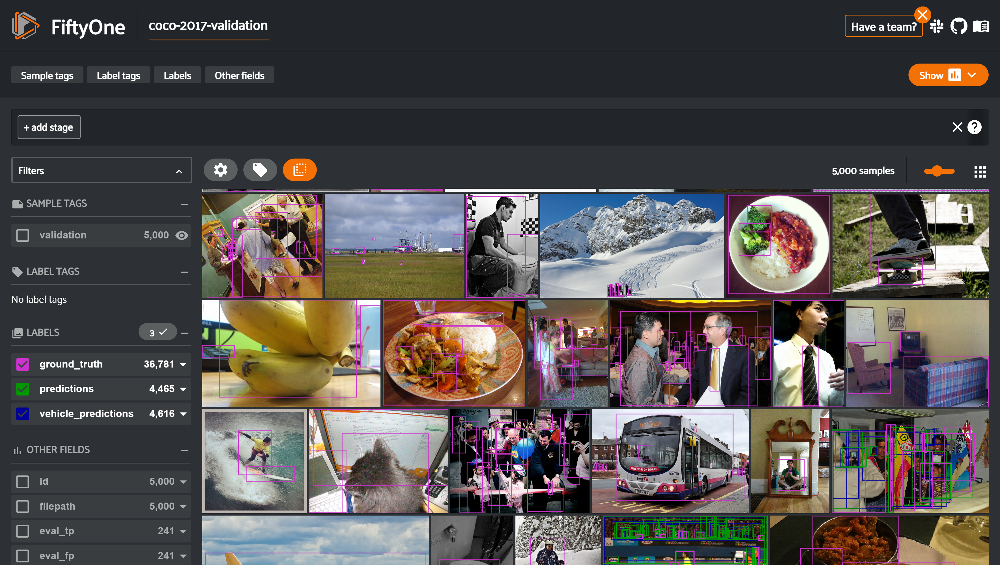

<IPython.core.display.Javascript object>

In [32]:
session = fo.launch_app(fo_dataset)

In [33]:
session.view = test_map_view.sort_by("eval_tp", reverse=False)

## Video Evaluation